<a href="https://colab.research.google.com/github/alitourani/vision-paper-hub/blob/main/categories/semseg/yolo26/yolov26.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **👁️‍🗨️ Vision Paper Hub** / **Segmentation, Classification, and Object Detection** / **YOLOv26**

This colaboratory is made to assess the quality of the **YOLOv26** model for Human Action Recognition.

- 🚀 [Benchmark](https://github.com/alitourani/vision-paper-hub/tree/main/categories/keypoint-detector/detectron-human-action)
- 🔗 [GitHub Repo](https://github.com/ultralytics/ultralytics)
- 📄 [Paper](https://doi.org/10.48550/arXiv.2509.25164)

## **I. Install the Library**

- First, you need to clone and install the framework:

- ⚠️ You might see a "Restart Session" warning during the first run in Google Colab due to library version mismatches. This is expected! Accept the restart, re-run this cell, and continue!

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 45.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 kB 9.8 MB/s eta 0:00:00


## **II. Upload an Image**

Saving iStock-1441416721.jpg to iStock-1441416721.jpg
- File "iStock-1441416721.jpg" uploaded with length 540206 bytes.


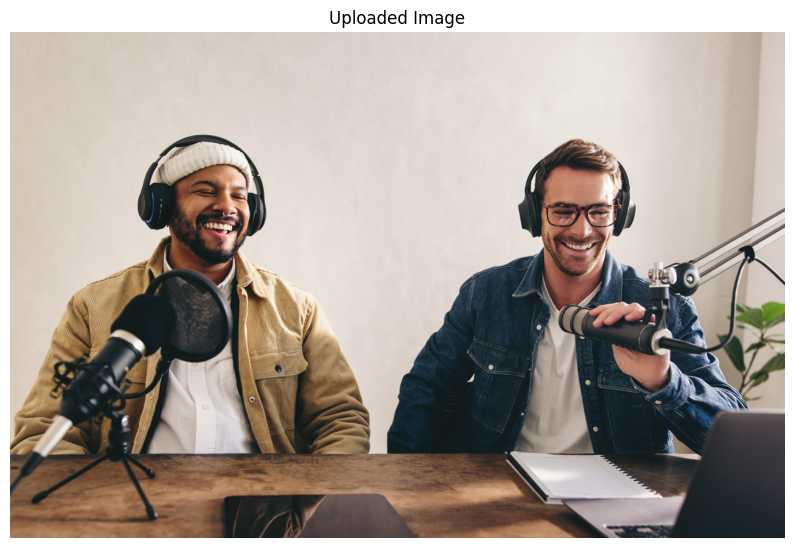

In [2]:
import os
import tempfile
import cv2 as cv
import numpy as np
import PIL.Image as Image
from google.colab import files
import matplotlib.pyplot as plt

# Variable for uploading files
image_path = ""
image_cv = None
image_pil = None
uploaded = files.upload()

for fn in uploaded.keys():
  print('- File "{name}" uploaded with length {length} bytes.'.format(
      name=fn, length=len(uploaded[fn])))

  # Save the uploaded file to a temporary location
  suffix = os.path.splitext(fn)[1] # Get extension
  with tempfile.NamedTemporaryFile(delete=False, suffix=suffix) as tmp_file:
    tmp_file.write(uploaded[fn])
    image_path = tmp_file.name

  try:
    # Load the image using OpenCV
    image_cv = cv.imread(image_path)
    # Load as PIL image
    image_pil = Image.fromarray(cv.cvtColor(image_cv, cv.COLOR_BGR2RGB))
  except Exception as X:
    print(f"[Error]: Could not load image '{fn}' with OpenCV!")

  # Display the image
  if image_pil is not None:
    plt.figure(figsize=(10, 10))
    plt.imshow(image_pil)
    plt.title(f"Uploaded Image")
    plt.axis('off')
    plt.show()

## **III. Using the Model for Computer Vision Tasks**

### III.A Object Detection


0: 448x640 2 persons, 1 dining table, 1 laptop, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


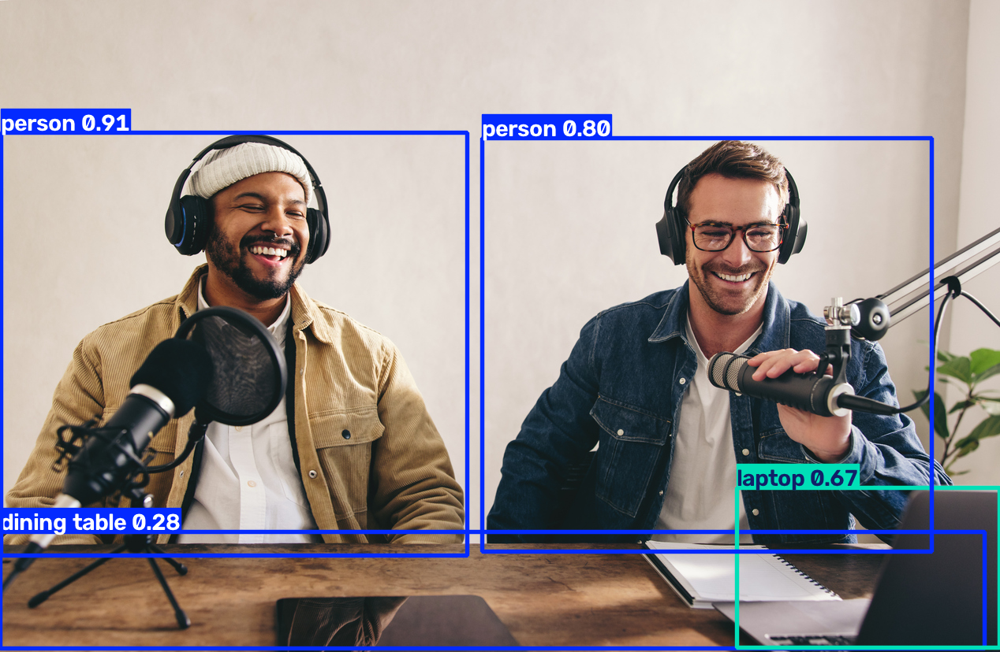

Ultralytics 8.4.157 🚀 Python-3.13.15 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino
YOLO26n summary (fused): 120 layers, 2,408,932 parameters, 0 gradients, 5.5 GFLOPs

PyTorch: starting from 'yolo26n.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 84, 8400) (5.3 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxruntime', 'onnxslim>=0.1.82'] not found, attempting AutoUpdate...
Using Python 3.13.15 environment at: /usr
Resolved 12 packages in 281ms
Prepared 5 packages in 505ms
Uninstalled 1 package in 4ms
Installed 5 packages in 33ms
 + colorama==0.4.6
 + onnx==1.23.0
 + onnxruntime==1.30.0
 + onnxslim==0.1.96
 - protobuf==5.29.6
 + protobuf==7.36.2

requirements: AutoUpdate success ✅ 1.1s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx

'yolo26n.onnx'

In [4]:
from ultralytics import YOLO

# Model
model = YOLO("yolo26n.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

# Export the model
model.export(format="onnx")

### III.B Instance Segmentation


0: 448x640 2 persons, 1 dining table, 1 laptop, 10.3ms
Speed: 2.1ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


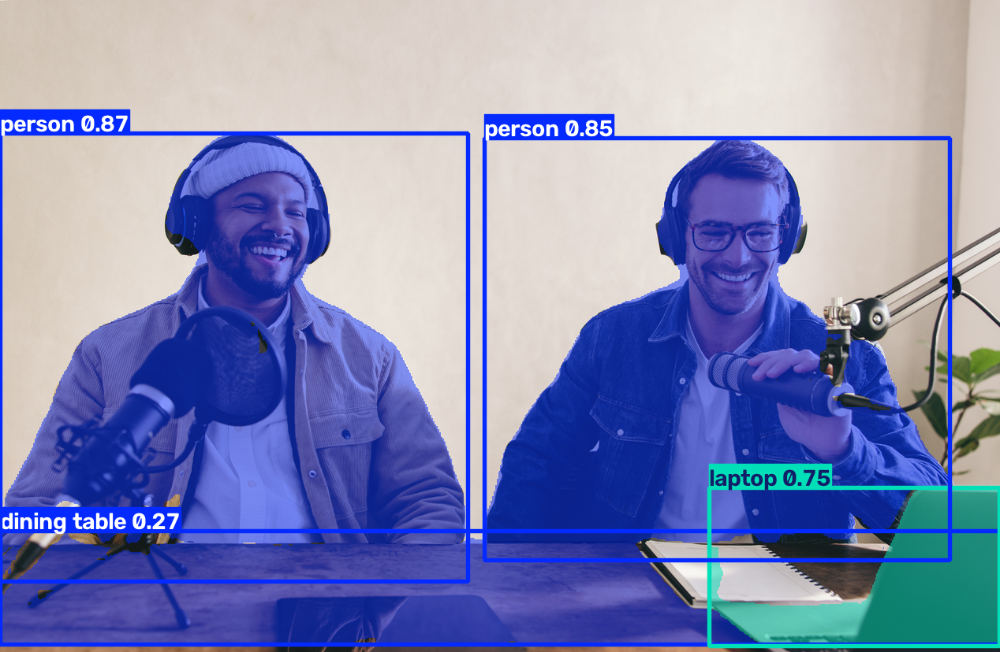

In [6]:
# Model
model = YOLO("yolo26n-seg.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

### III.C Semantic Segmentation


0: 672x1024 8.3ms
Speed: 4.9ms preprocess, 8.3ms inference, 19.3ms postprocess per image at shape (1, 3, 672, 1024)


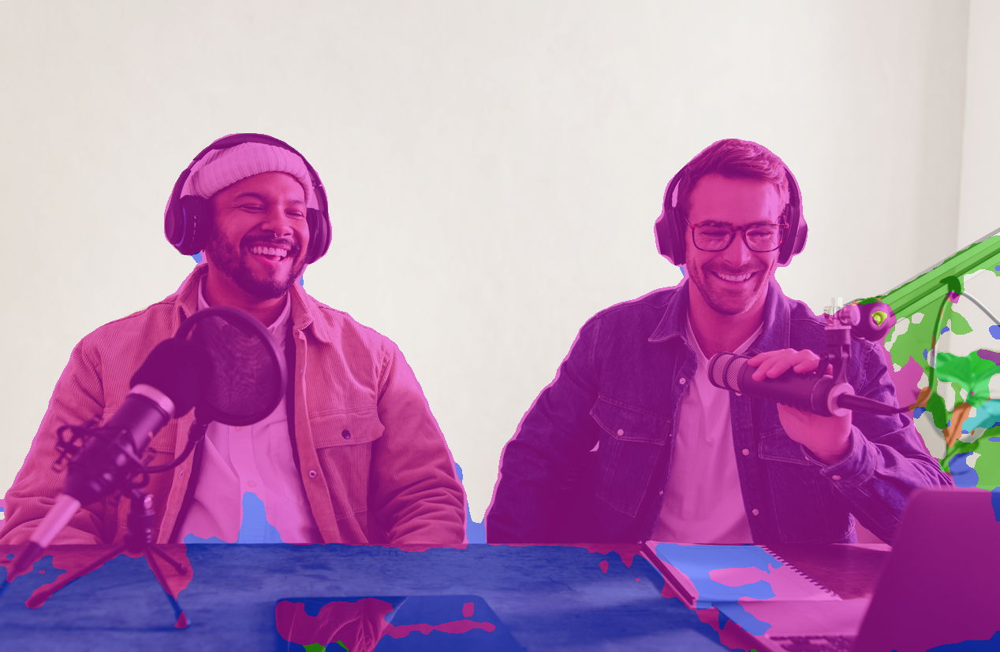

In [7]:
# Model
model = YOLO("yolo26n-sem.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

### III.D Depth Estimation


0: 512x768 depth 0.98-2.36m, 16.3ms
Speed: 3.0ms preprocess, 16.3ms inference, 0.3ms postprocess per image at shape (1, 3, 512, 768)


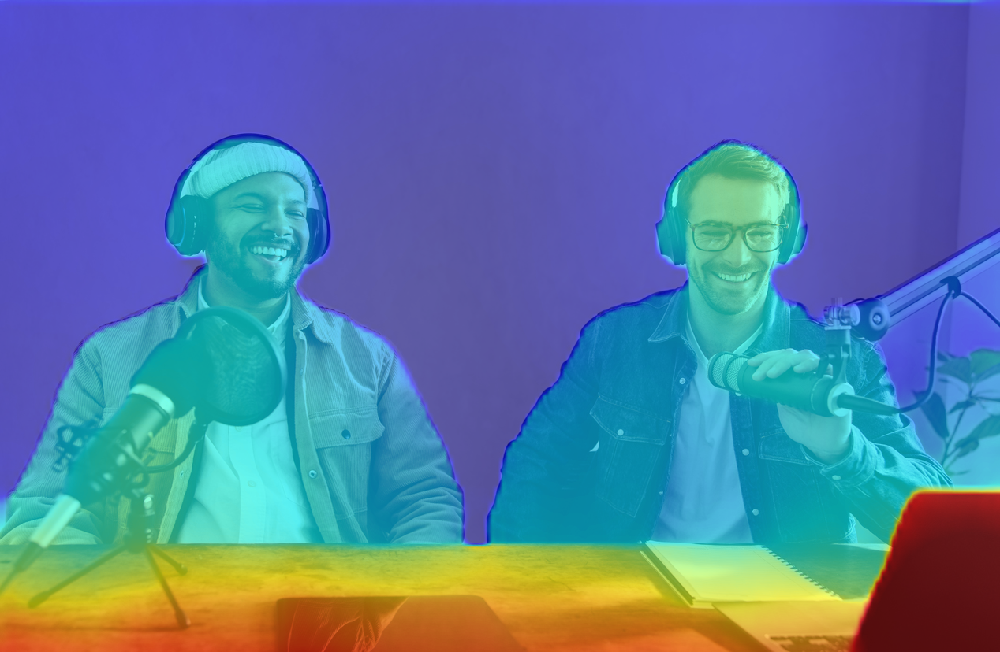

In [8]:
# Model
model = YOLO("yolo26n-depth.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

### III.E Image Classification


0: 224x224 sunglass 0.22, loupe 0.15, sunglasses 0.10, gasmask 0.03, hammer 0.03, 6.7ms
Speed: 68.0ms preprocess, 6.7ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


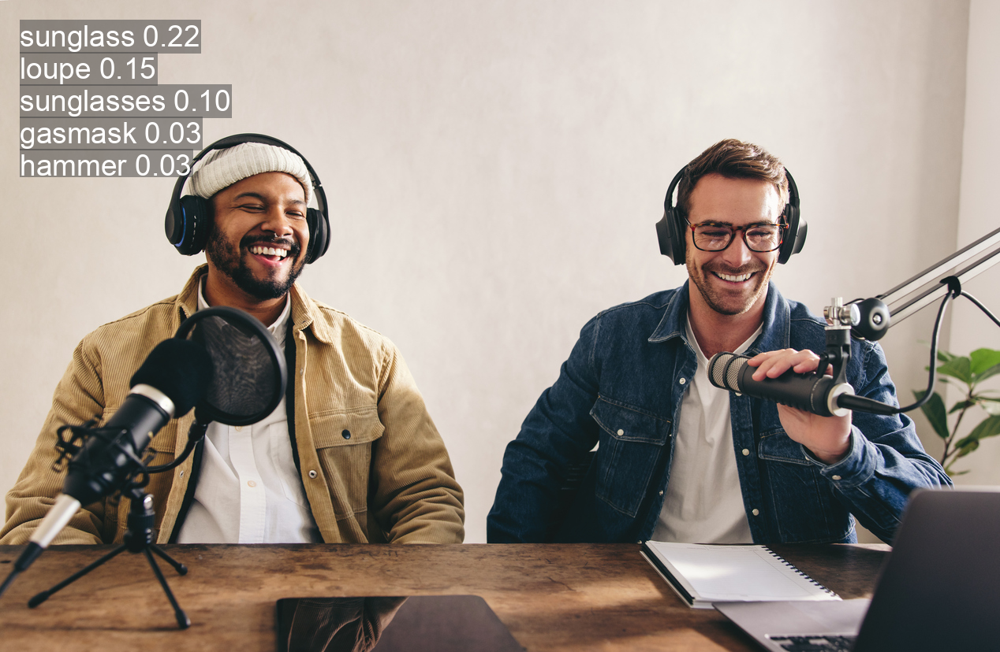

In [9]:
# Model
model = YOLO("yolo26n-cls.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

### III.F Pose Estimation


0: 448x640 2 persons, 11.8ms
Speed: 4.2ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


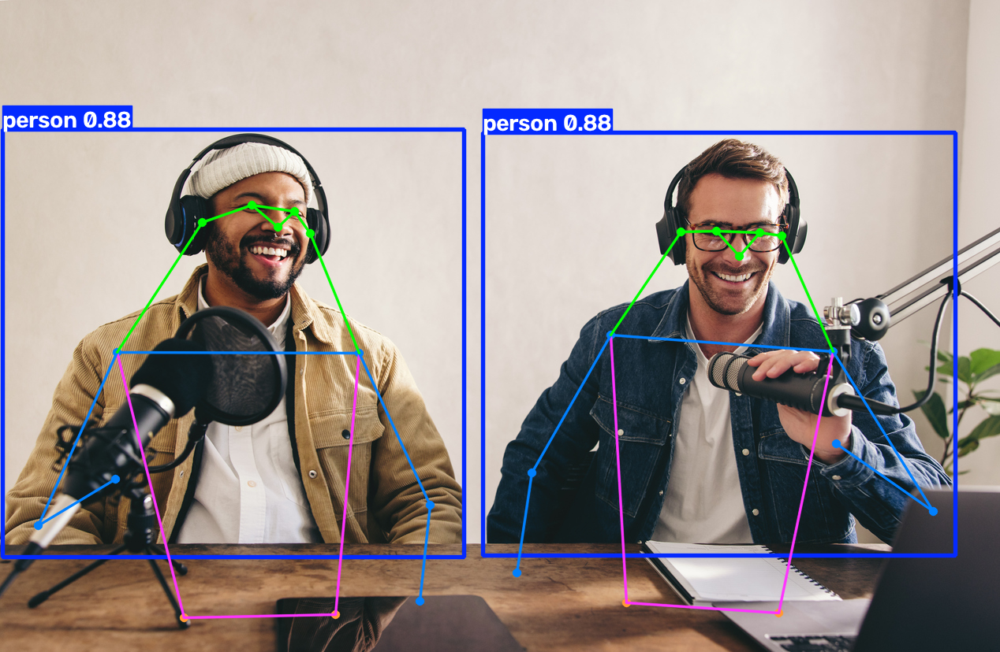

In [10]:
# Model
model = YOLO("yolo26n-pose.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()

### III.G Oriented Bounding Boxes (OBB)


0: 672x1024 (no detections), 12.3ms
Speed: 4.6ms preprocess, 12.3ms inference, 0.4ms postprocess per image at shape (1, 3, 672, 1024)


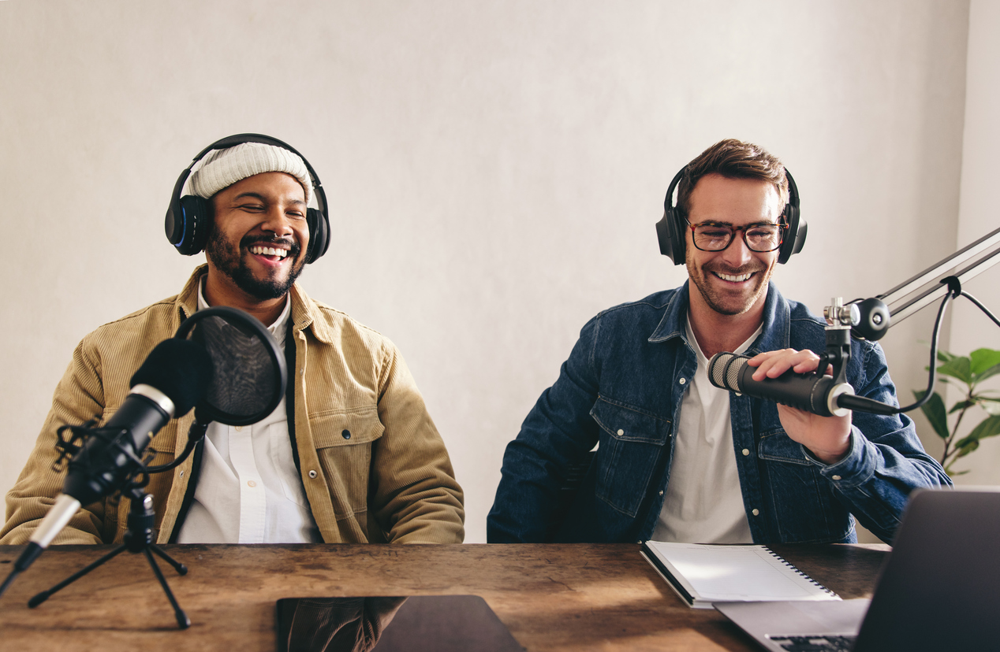

In [11]:
# Model
model = YOLO("yolo26n-obb.pt")

# Predict
results = model.predict(image_cv)

# Show the results
results[0].show()